# <font style = "color:rgb(50,120,229)"> Coin Detection </font>

So far we have studied about various mophological operations and different thresholding techniques in some detail. Now it's time to apply these concepts for a practical application - **Coin Detection**.

## <font style = "color:rgb(50,120,229)"> Aim </font>

In this assignment, you will work with 2 different images (so 2 different parts) and will use **only** morphological operations and thresholding techniques to detect the total number of coins present in the image. Your submission will be graded based on your use of the concepts covered in this module, experimentation performed to achieve at your final solution, documentation, and finally, the total number of coins successfully detected in the images. Each part will be of 15 marks. This assignment will be entirely **manually graded** so make sure that you do NOT remove any experimentation you have done as well as the observation you made after each step.

**Proper documentation for each step should be provided with help of markdown**

## <font style = "color:rgb(50,120,229)">Outline</font>

The main steps that you can follow to solve this assignment are:

1. Read the image.
2. Convert it to grayscale and split the image into the 3 (Red, Green and Blue) channels. Decide which of the above 4 images you want to use in further steps and provide reason for the same.
3. Use thresholding and/or morphological operations to arrive at a final binary image.
4. Use **simple blob detector** to count the number of coins present in the image.
5. Use **contour detection** to count the number of coins present in the image.
6. Use **CCA** to count the number of coins present in the image.

**We have also provided the results we obtained at the intermediate steps for your reference.**

# <font style = "color:rgb(50,120,229)">Assignment Part - A</font>

## <font style = "color:rgb(50,120,229)"> Step 1: Read Image</font>

In [1]:
import cv2
import matplotlib.pyplot as plt
from dataPath import DATA_PATH
import numpy as np
%matplotlib inline

In [2]:
import matplotlib
matplotlib.rcParams['figure.figsize'] = (10.0, 10.0)
matplotlib.rcParams['image.cmap'] = 'gray'

Text(0.5, 1.0, 'Original Image')

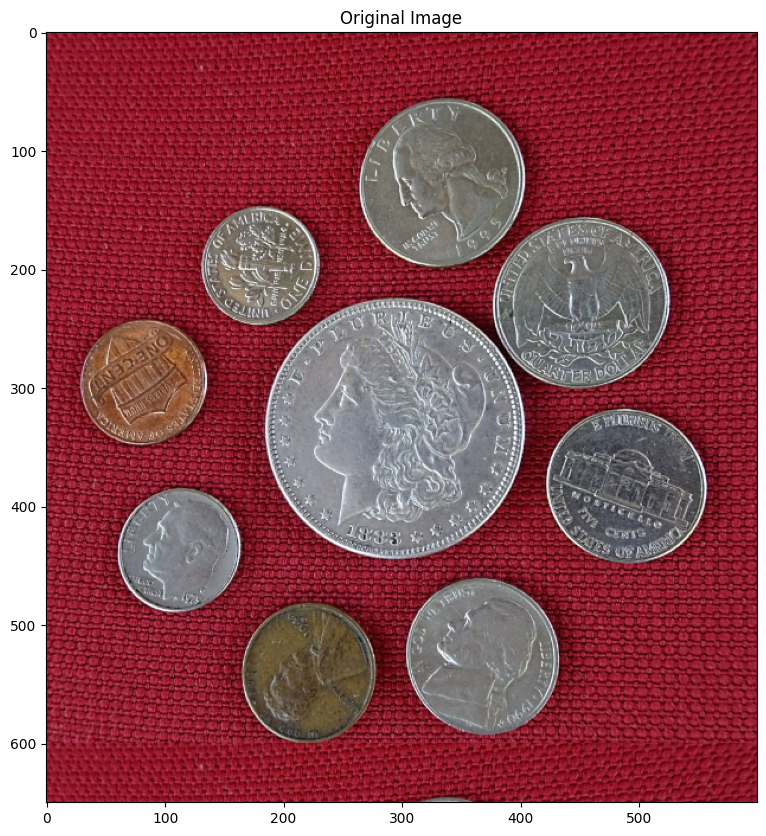

In [3]:
# Image path
imagePath = DATA_PATH + "images/CoinsA.png"
# Read image
# Store it in the variable image
image = cv2.imread(imagePath, cv2.IMREAD_COLOR)
imageCopy = image.copy()
plt.imshow(image[:,:,::-1]);
plt.title("Original Image")

## <font style = "color:rgb(50,120,229)">Step 2.1: Convert Image to Grayscale</font>

In [4]:
# Convert image to grayscale
imageGray = cv2.cvtColor(src=image, code=cv2.COLOR_BGR2GRAY)


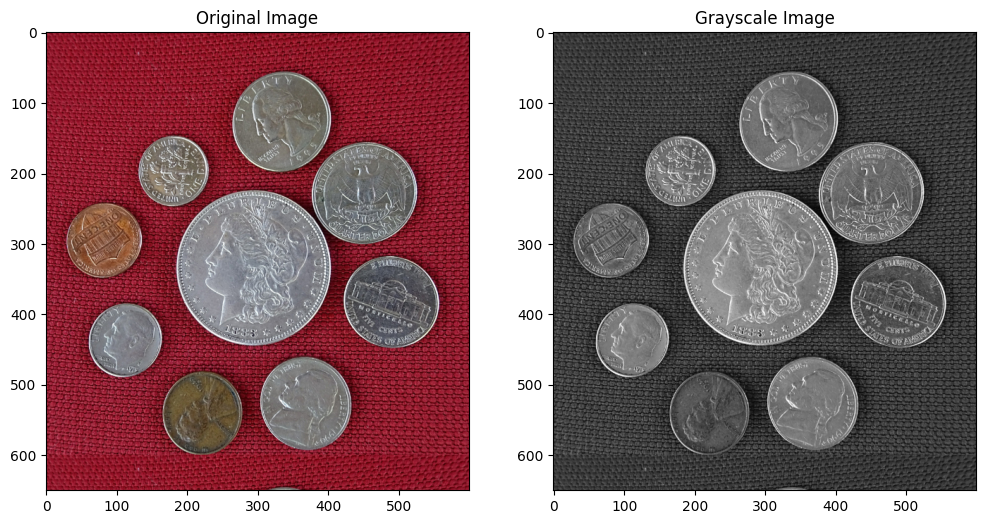

In [5]:
plt.figure(figsize=(12,12))
plt.subplot(121)
plt.imshow(image[:,:,::-1]);
plt.title("Original Image")
plt.subplot(122)
plt.imshow(imageGray);
plt.title("Grayscale Image");

## <font style = "color:rgb(50,120,229)">Step 2.2: Split Image into R,G,B Channels</font>

In [6]:
# Split cell into channels
imageB, imageG, imageR = cv2.split(image)


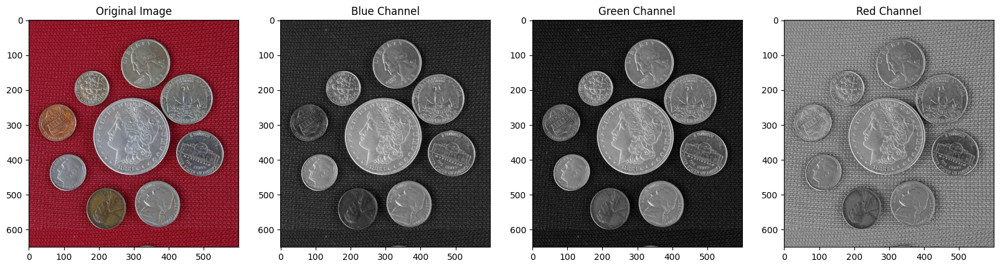

In [7]:
plt.figure(figsize=(20,12))
plt.subplot(141)
plt.imshow(image[:,:,::-1]);
plt.title("Original Image")
plt.subplot(142)
plt.imshow(imageB);
plt.title("Blue Channel")
plt.subplot(143)
plt.imshow(imageG);
plt.title("Green Channel")
plt.subplot(144)
plt.imshow(imageR);
plt.title("Red Channel");

## <font style = "color:rgb(50,120,229)">Step 3.1: Perform Thresholding</font>

You will have to carry out this step with different threshold values to see which one suits you the most. Do not remove those intermediate images and make sure to document your findings.

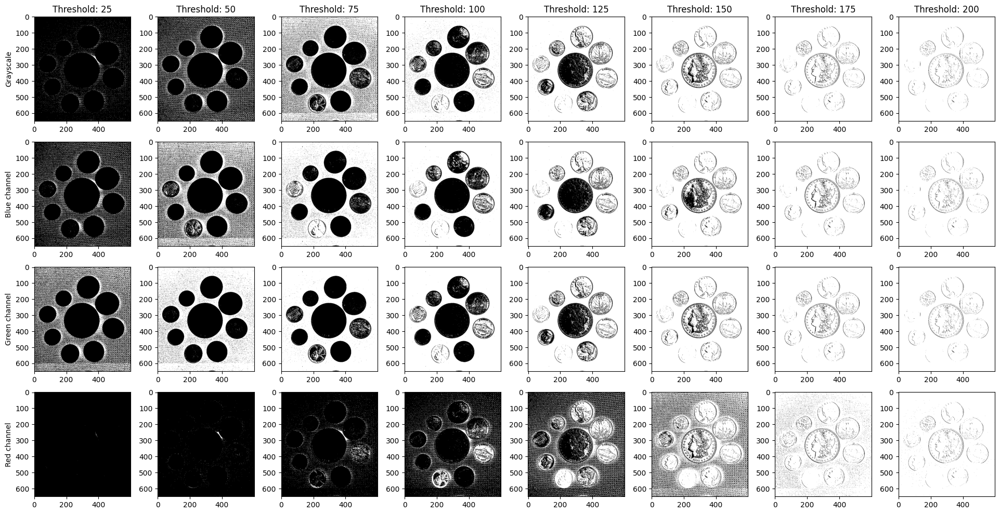

In [66]:
thresholds = range(25, 201, 25) #range(25,250,25)
n_thresholds = len(thresholds)
n_imgs = 4
plt.figure(figsize=((3 * n_thresholds), (3 * n_imgs)))
for i, threshold in enumerate(thresholds):
    _, thresh_gray= cv2.threshold(src=imageGray, thresh=threshold, maxval=255, type=cv2.THRESH_BINARY_INV)
    _, thresh_b= cv2.threshold(src=imageB, thresh=threshold, maxval=255, type=cv2.THRESH_BINARY_INV)
    _, thresh_g= cv2.threshold(src=imageG, thresh=threshold, maxval=255, type=cv2.THRESH_BINARY_INV)
    _, thresh_r= cv2.threshold(src=imageR, thresh=threshold, maxval=255, type=cv2.THRESH_BINARY_INV)
    
    fig_num = i + 1
    plt.subplot(n_imgs, n_thresholds, fig_num + (0 * n_thresholds))
    plt.imshow(thresh_gray)
    plt.title(f"Threshold: {threshold}")
    if (not i):
        plt.ylabel("Grayscale")
    
    plt.subplot(n_imgs, n_thresholds, fig_num + (1 * n_thresholds))
    plt.imshow(thresh_b)
    if (not i):
        plt.ylabel("Blue channel")
    
    plt.subplot(n_imgs, n_thresholds, fig_num + (2 * n_thresholds))
    plt.imshow(thresh_g)
    if (not i):
        plt.ylabel("Green channel")
    
    plt.subplot(n_imgs, n_thresholds, fig_num + (3 * n_thresholds))
    plt.imshow(thresh_r)
    if (not i):
        plt.ylabel("Red channel")   
    

### Threshold Selection:

**Channel:** Green

**Threshold:** 25

*Justification*

Observing the above image range, the red channel can be categorically eliminated due to lack of sufficient contrast and the same can be applied to any threshold >=125.

Similarly thresholds <=75 identify the coins distinctly due to minimized details within the coins. Additionally, the blue channel does not show consistency in categorizing ALL coins on the same side of the threshold.

Given that the grayscale is a summation (figuratively) of the three channels, it include the errors from all channels along with the information. Considering the error sensitivity, it is undesirable.

Lastly, both Green 25 & Green 50 can be used since the noise in Green 50 will be removed by morphology operations but Green 25 just has the lower noise and a clear winner.

(650, 600)


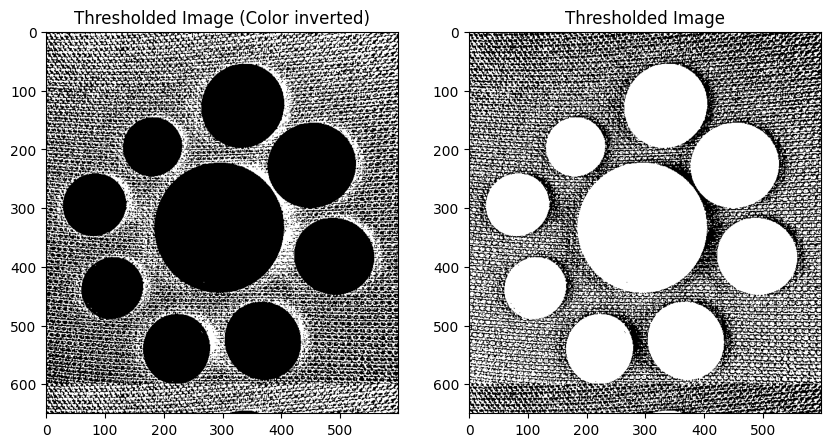

In [69]:
# Display the thresholded image
_, thresholded_image = cv2.threshold(src=imageG, thresh=25, maxval=255, type=cv2.THRESH_BINARY)
_, thresholded_image_inv = cv2.threshold(src=imageG, thresh=25, maxval=255, type=cv2.THRESH_BINARY_INV)
plt.subplot(1,2,1)
plt.imshow(thresholded_image_inv)
plt.title("Thresholded Image (Color inverted)")

plt.subplot(1,2,2)
plt.imshow(thresholded_image)
plt.title("Thresholded Image")
print(thresholded_image.shape)

### Theory:
Eroding an image has the same effect dilating the inverted grayscale image and inverting the output

### Validation:
The following cell uses an elliptical kernel of different size and performs erosion and dilation on mutually inverted images. It then inverts one of the images, finds the difference between the two images and sums the differences in individual pixels. 

As can be seen, the net sum of 0 for a matrix of unsigned integers implies that the images are the same. i.e. **THEORY VALIDATED**.

*Implication:*
Only one of the thresholded images may be used from this point. The inverted thresholding is selected as the SimpleBlobDetector is designed to detect black blobs on a white background and as such, black coins are desirable

Text(0.5, 0, 'Diff: 0')

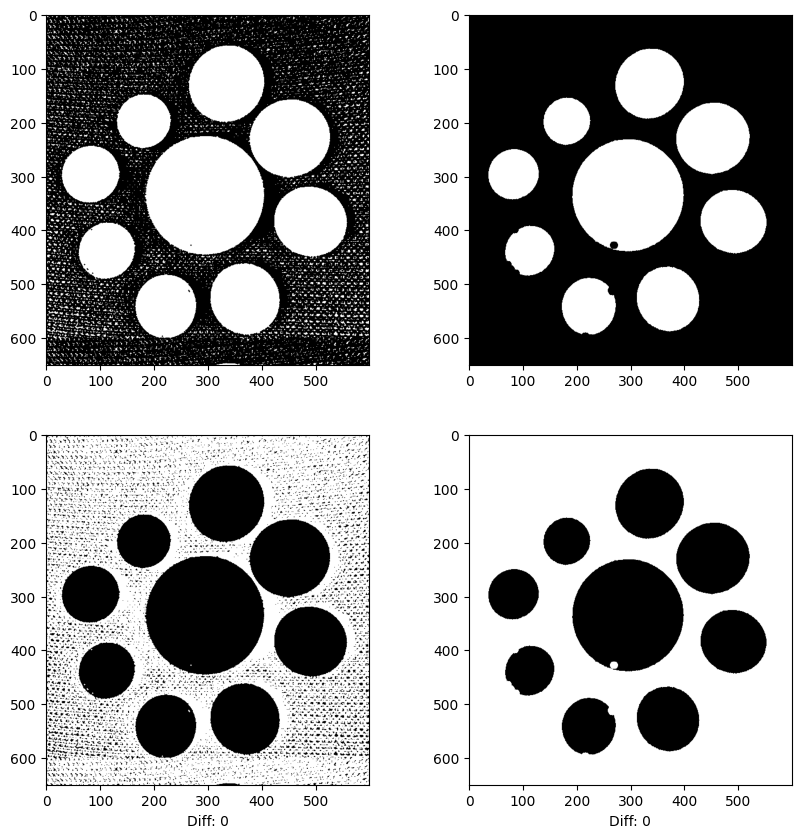

In [78]:
kernel = cv2.getStructuringElement(shape=cv2.MORPH_ELLIPSE, ksize=(3, 3))
img1 = cv2.erode(thresholded_image, kernel=kernel, iterations=1)
plt.subplot(2, 2, 1)
plt.imshow(img1)

img3 = cv2.dilate(thresholded_image_inv, kernel=kernel, iterations=1)
plt.subplot(2, 2, 3)
plt.imshow(img3)
plt.xlabel(f"Diff: {((255-img1) - img3).sum()}")

kernel = cv2.getStructuringElement(shape=cv2.MORPH_ELLIPSE, ksize=(15, 15))
img2 = cv2.erode(thresholded_image, kernel=kernel, iterations=1)
plt.subplot(2, 2, 2)
plt.imshow(img2)

img4 = cv2.dilate(thresholded_image_inv, kernel=kernel, iterations=1)
plt.subplot(2, 2, 4)
plt.imshow(img4)
plt.xlabel(f"Diff: {((255-img2) - img4).sum()}")


## <font style = "color:rgb(50,120,229)">Step 3.2: Perform morphological operations</font>

You will have to carry out this step with different kernel size, kernel shape and morphological operations to see which one (or more) suits you the most. Do not remove those intermediate images and make sure to document your findings.

In [384]:
kernel_sizes = range(3, (np.sqrt(thresholded_image_inv.shape[0])).astype(int), 2)
kernel_shapes = [cv2.MORPH_RECT, cv2.MORPH_ELLIPSE, cv2.MORPH_CROSS, cv2.MORPH_DIAMOND]
shape_names = ["MORPH_RECT", "MORPH_ELLIPSE", "MORPH_CROSS", "MORPH_DIAMOND"]
kernels = [[cv2.getStructuringElement(shape=k_sh,
                                      ksize=(k_sz, k_sz)) for k_sz in kernel_sizes] for k_sh in kernel_shapes]

n_sizes = len(kernel_sizes)
n_shapes = len(kernel_shapes)


In [ ]:
## Pure Erosion
plt.figure( figsize=((3 * n_sizes), (3 * n_shapes)))
for i_sh, shaped_kernels in enumerate(kernels):
    for i_sz, kernel in enumerate(shaped_kernels):
        img = cv2.erode(src=thresholded_image_inv, kernel=kernel, iterations=1)
        plt.subplot(n_shapes, n_sizes, ((i_sh * n_sizes) + i_sz + 1))
        plt.imshow(img)
        if (not i_sh):
            plt.title(kernel_sizes[i_sz])
        if (not i_sz):
            plt.ylabel(shape_names[i_sh])

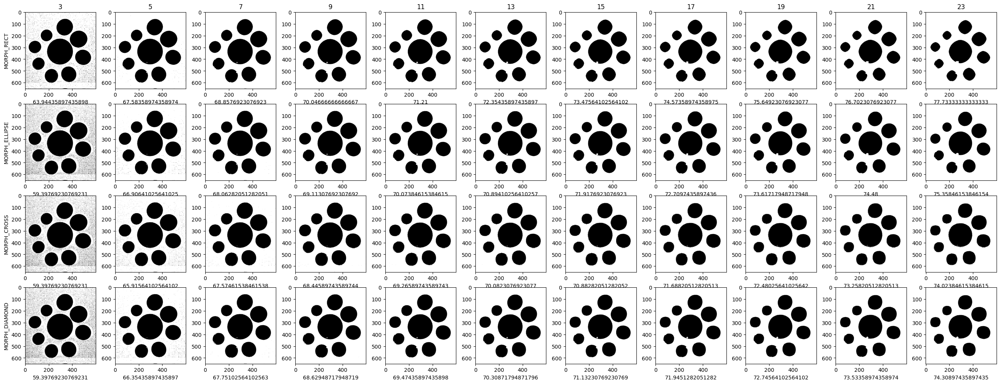

In [386]:
## Pure Dilation
plt.figure( figsize=((3 * n_sizes), (3 * n_shapes)))
for i_sh, shaped_kernels in enumerate(kernels):
    for i_sz, kernel in enumerate(shaped_kernels):
        img = cv2.dilate(src=thresholded_image_inv, kernel=kernel, iterations=1)
        plt.subplot(n_shapes, n_sizes, ((i_sh * n_sizes) + i_sz + 1))
        plt.imshow(img)
        if (not i_sh):
            plt.title(kernel_sizes[i_sz])
        if (not i_sz):
            plt.ylabel(shape_names[i_sh])
        plt.xlabel((img/255).sum() * 100 / (img.shape[0] * img.shape[1]))

### Choice

Shape: MORPH_CROSS
The other shapes result in extensive damage to the existing silhouettes.

Size: 15 (index 6) 
Maximize proportion of white pixels (x label) while removing any outlying black pixels

In [387]:
dilated_image = cv2.dilate(src=thresholded_image_inv, kernel=kernels[2][6], iterations=1)
dilated_image_inv = 255 - dilated_image

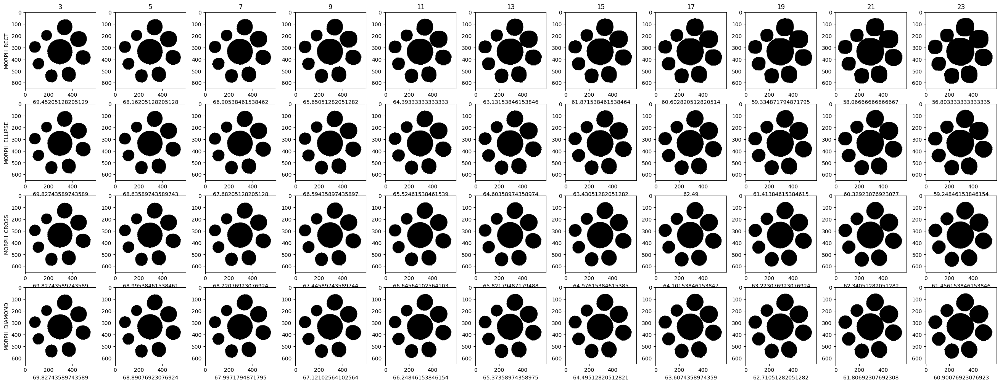

In [388]:
## Manual Closing - Erosion
plt.figure( figsize=((3 * n_sizes), (3 * n_shapes)))
for i_sh, shaped_kernels in enumerate(kernels):
    for i_sz, kernel in enumerate(shaped_kernels):
        img = cv2.erode(src=dilated_image, kernel=kernel, iterations=1)
        plt.subplot(n_shapes, n_sizes, ((i_sh * n_sizes) + i_sz + 1))
        plt.imshow(img)
        if (not i_sh):
            plt.title(kernel_sizes[i_sz])
        if (not i_sz):
            plt.ylabel(shape_names[i_sh])
        plt.xlabel((img/255).sum() * 100 / (img.shape[0] * img.shape[1]))
        

### Choice

Shape: MORPH_ELLIPSE
Keeps shape without hair-like borders

Size: 9 (index 3) 
Maximizes border smoothness while ensuring gaps between coins

In [369]:
eroded_dilated_image = cv2.erode(src=dilated_image, kernel=kernels[1][0], iterations=1)
eroded_dilated_image_inv = 255 - eroded_dilated_image

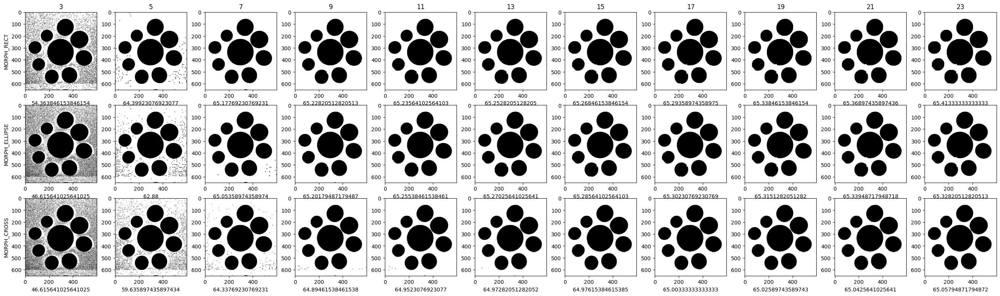

In [314]:
## Closing
plt.figure( figsize=((3 * n_sizes), (3 * n_shapes)))
for i_sh, shaped_kernels in enumerate(kernels):
    for i_sz, kernel in enumerate(shaped_kernels):
        img = cv2.morphologyEx(src=thresholded_image_inv, op=cv2.MORPH_CLOSE, kernel=kernel, iterations=1)
        plt.subplot(n_shapes, n_sizes, ((i_sh * n_sizes) + i_sz + 1))
        plt.imshow(img)
        if (not i_sh):
            plt.title(kernel_sizes[i_sz])
        if (not i_sz):
            plt.ylabel(shape_names[i_sh])
        plt.xlabel((img/255).sum() * 100 / (img.shape[0] * img.shape[1]))

### Choice

Shape: MORPH_CROSS
Best maintains silhouette

Size: 15 (index 6) 
Lowest whitespace without hanging black pixels

In [338]:
closedImage = cv2.morphologyEx(src=thresholded_image_inv, op=cv2.MORPH_CLOSE, kernel=kernels[2][6])
closedImage_inv = 255-closedImage

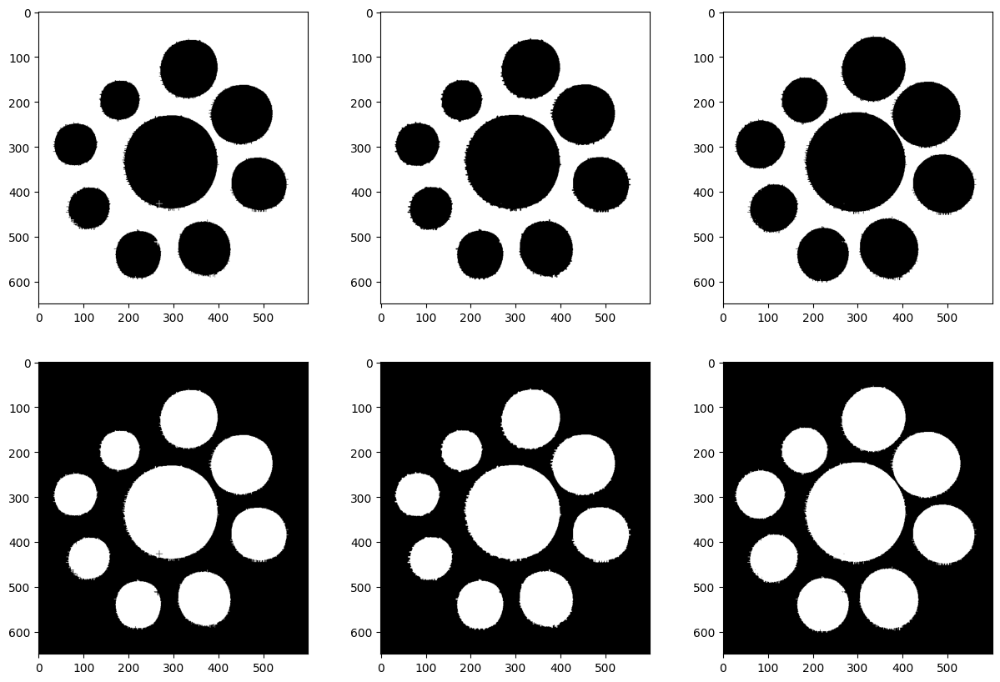

In [370]:
plt.figure(figsize=(15, 10))
plt.subplot(231)
plt.imshow(dilated_image)
plt.subplot(232)
plt.imshow(eroded_dilated_image)
plt.subplot(233)
plt.imshow(closedImage)
plt.subplot(234)
plt.imshow(dilated_image_inv)
plt.subplot(235)
plt.imshow(eroded_dilated_image_inv)
plt.subplot(236)
plt.imshow(closedImage_inv)

## <font style = "color:rgb(50,120,229)">Step 4.1: Create SimpleBlobDetector</font>

In [316]:
# Set up the SimpleBlobdetector with default parameters.
params = cv2.SimpleBlobDetector_Params()

params.filterByColor = True
params.blobColor = 255

params.minDistBetweenBlobs = 20

# Filter by Area.
params.filterByArea = False

# Filter by Circularity
params.filterByCircularity = False

# Filter by Convexity
params.filterByConvexity = False

# Filter by Inertia
params.filterByInertia = False

In [317]:
# Create SimpleBlobDetector
detector = cv2.SimpleBlobDetector_create(params)

## <font style = "color:rgb(50,120,229)">Step 4.2: Detect Coins</font>

### <font style = "color:rgb(8,133,37)">Hints</font>
Use **`detector.detect(image)`** to detect the blobs (coins). The output of the function is a list of **keypoints** where each keypoint is unique for each blob.

Print the number of coins detected as well.

In [318]:
# Detect blobs

keypoints = detector.detect(eroded_dilated_image_inv)

In [319]:
# Print number of coins detected
print(len(keypoints))

9


**Note that we were able to detect all 9 coins. So, that's your benchmark.**

## <font style = "color:rgb(50,120,229)">Step 4.3: Display the detected coins on original image</font>

Make sure to mark the center of the blobs as well. **Use only the functions discussed in Image Annotation section in Week 1**

### <font style = "color:rgb(8,133,37)">Hints</font>
You can extract the coordinates of the center and the diameter of a blob using **`k.pt`** and **`k.size`** where `k` is a keypoint.

In [356]:
line_thickness = int(0.005 * image.shape[0])

In [357]:
# Mark coins using image annotation concepts we have studied so far
marked_image = image.copy()
for i, keypoint in enumerate(keypoints):
    cv2.circle(img=marked_image, 
               center=(int(keypoint.pt[0]), int(keypoint.pt[1])),
               radius=2,
               color=(255, 0),
               thickness=line_thickness,
               lineType=cv2.LINE_AA)
    cv2.circle(img=marked_image, 
               center=(int(keypoint.pt[0]), int(keypoint.pt[1])),
               radius=int(keypoint.size / 2),
               color=(0, 255, 0),
               thickness=line_thickness,
               lineType=cv2.LINE_AA)


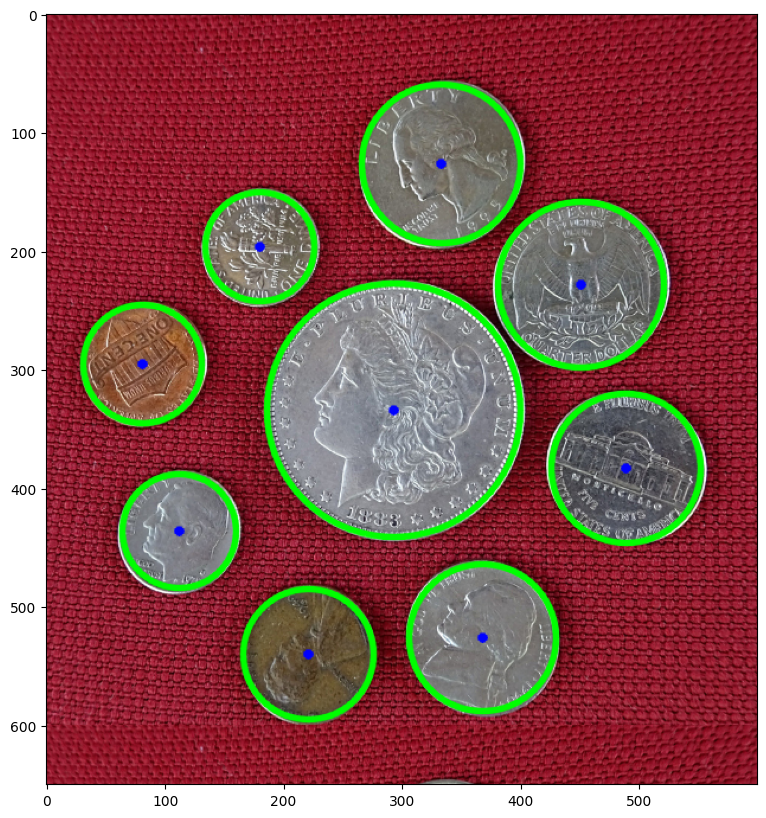

In [358]:
# Display the final image
plt.imshow(marked_image[...,::-1])


## <font style = "color:rgb(50,120,229)">Step 4.4: Perform Connected Component Analysis</font>

In the final step, perform Connected Component Analysis (CCA) on the binary image to find out the number of connected components. Do you think we can use CCA to calculate number of coins? Why/why not?

In [322]:
def displayConnectedComponents(im):
    imLabels = im
    # The following line finds the min and max pixel values
    # and their locations in an image.
    (minVal, maxVal, minLoc, maxLoc) = cv2.minMaxLoc(imLabels)
    # Normalize the image so the min value is 0 and max value is 255.
    imLabels = 255 * (imLabels - minVal)/(maxVal-minVal)
    # Convert image to 8-bits unsigned type
    imLabels = np.uint8(imLabels)
    # Apply a color map
    imColorMap = cv2.applyColorMap(imLabels, cv2.COLORMAP_JET)
    # Display colormapped labels
    plt.imshow(imColorMap[:,:,::-1])

In [359]:
# Find connected components
_, imLabels = cv2.connectedComponents(image=eroded_dilated_image_inv)


In [360]:
# Print number of connected components detected
print(f"Number of connected components detected = {imLabels.max()}")


Number of connected components detected = 9


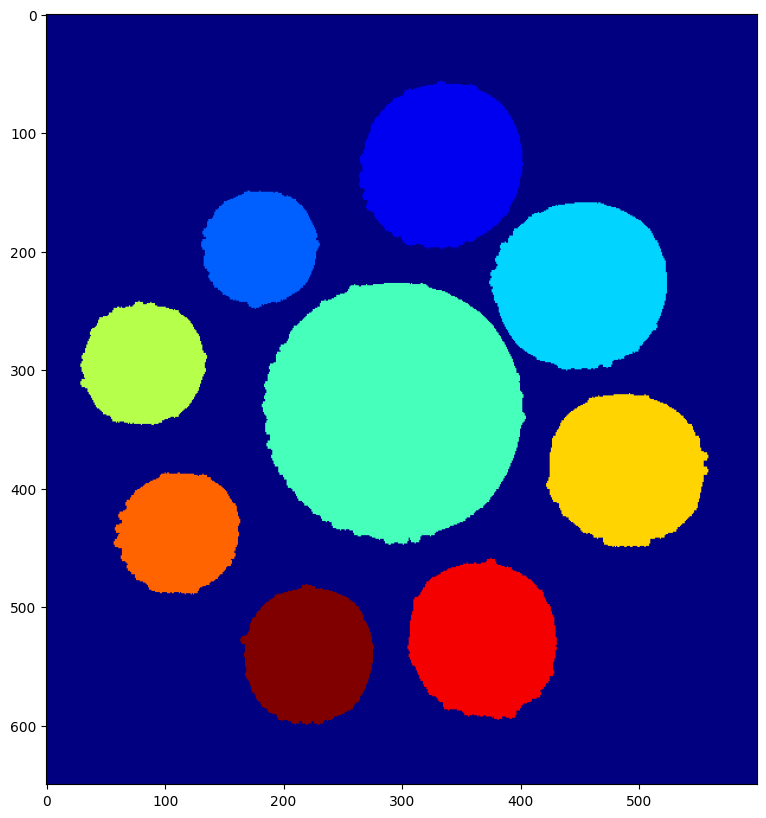

In [361]:
# Display connected components using displayConnectedComponents
# function
displayConnectedComponents(imLabels)


## <font style = "color:rgb(50,120,229)">Step 4.5: Detect coins using Contour Detection</font>

In the final step, perform Contour Detection on the binary image to find out the number of coins.

In [ ]:
# Find all contours in the image
contours, hierarchy = cv2.findContours(image=eroded_dilated_image, mode=cv2.RETR_LIST, method=cv2.CHAIN_APPROX_SIMPLE)
print(hierarchy)

[[[ 1 -1 -1 -1]
  [ 2  0 -1 -1]
  [ 3  1 -1 -1]
  [ 4  2 -1 -1]
  [ 5  3 -1 -1]
  [ 6  4 -1 -1]
  [ 7  5 -1 -1]
  [ 8  6 -1 -1]
  [ 9  7 -1 -1]
  [-1  8 -1 -1]]]


In [327]:
# Print the number of contours found
print(len(contours))


10


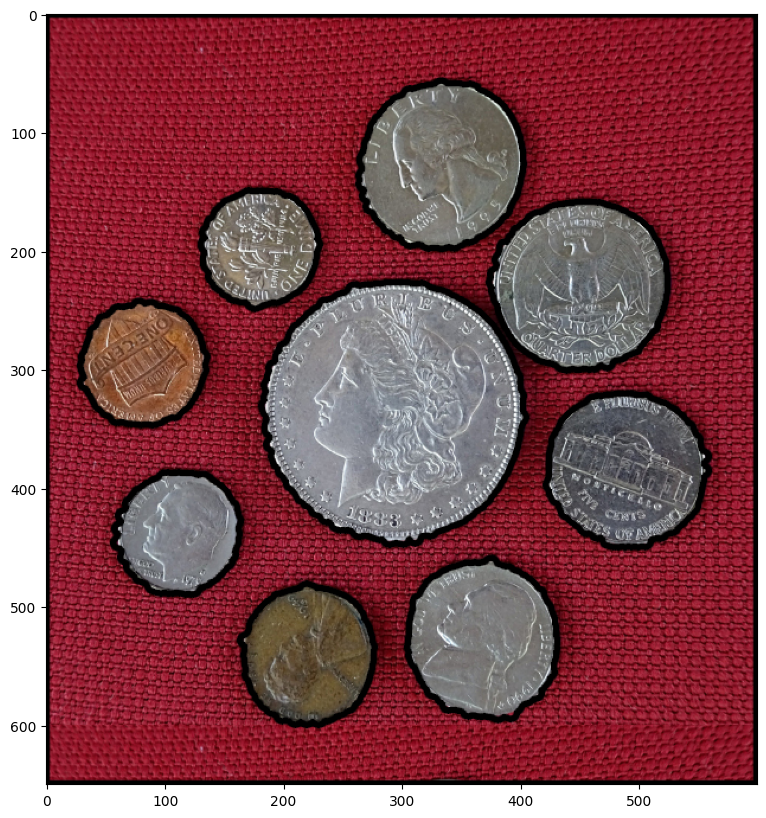

In [328]:
# Draw all contours
contoured_image = image.copy()
cv2.drawContours(contoured_image, contours=contours, contourIdx=-1, color=(0, 0, 0), thickness=line_thickness, lineType=cv2.LINE_AA)
plt.imshow(contoured_image[...,::-1])


Let's only consider the outer contours.

Number of contours found = 1


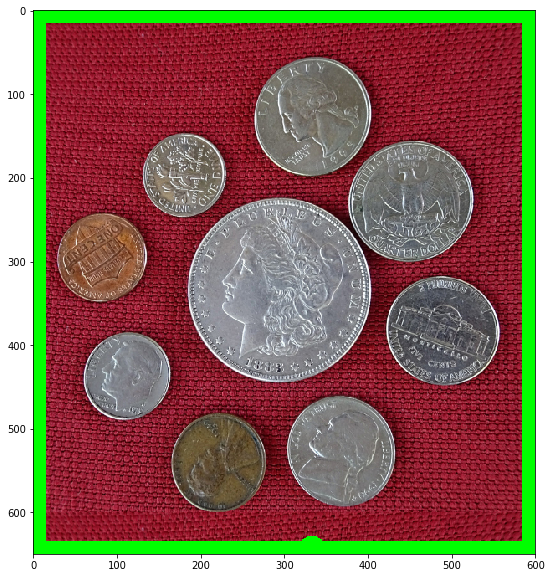

In [ ]:
# Remove the inner contours
# Display the result
###
### YOUR CODE HERE
###


So, we only need the inner contours. The easiest way to do that will be to remove the outer contour using area.

In [ ]:
# Print area and perimeter of all contours
###
### YOUR CODE HERE
###


Contour #1 has area = 11118.0 and perimeter = 401.9310212135315
Contour #2 has area = 14133.5 and perimeter = 456.9432144165039
Contour #3 has area = 9075.5 and perimeter = 373.2030990123749
Contour #4 has area = 14482.5 and perimeter = 456.8010768890381
Contour #5 has area = 9404.5 and perimeter = 367.5462449789047
Contour #6 has area = 39121.5 and perimeter = 748.3645672798157
Contour #7 has area = 17612.0 and perimeter = 500.8427075147629
Contour #8 has area = 8298.5 and perimeter = 344.5756813287735
Contour #9 has area = 16370.5 and perimeter = 484.11478412151337
Contour #10 has area = 388697.0 and perimeter = 2497.4558429718018


In [ ]:
# Print maximum area of contour
# This will be the box that we want to remove
###
### YOUR CODE HERE
###


Maximum area of contour = 388697.0


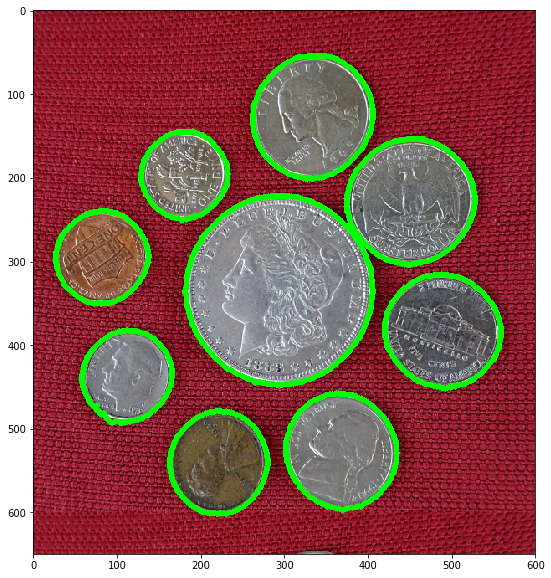

In [ ]:
# Remove this contour and plot others
###
### YOUR CODE HERE
###


Number of coins detected = 9


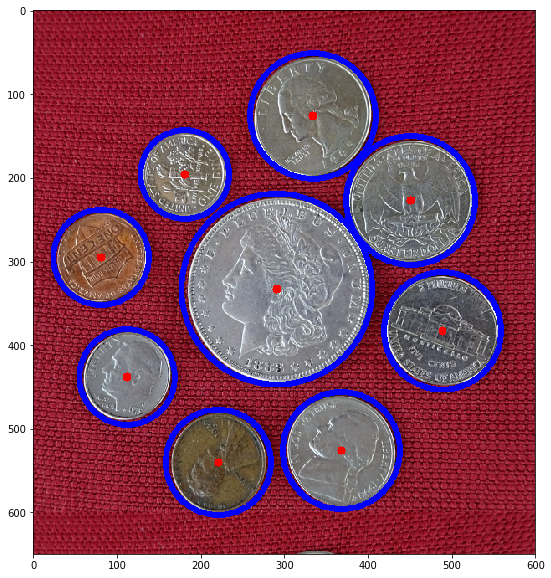

In [ ]:
# Fit circles on coins
###
### YOUR CODE HERE
###


# <font style = "color:rgb(50,120,229)">Assignment Part - B</font>

**Follow the same steps as provided in Assignment Part - A**

## <font style = "color:rgb(50,120,229)"> Step 1: Read Image</font>

Text(0.5,1,'Original Image')

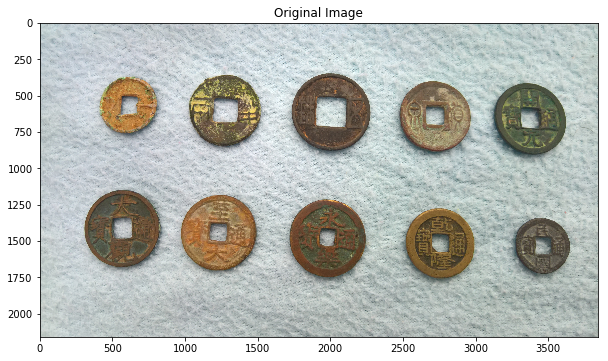

In [ ]:
# Image path
imagePath = DATA_PATH + "images/CoinsB.png"
# Read image
# Store it in variable image
###
### YOUR CODE HERE
###
plt.imshow(image[:,:,::-1]);
plt.title("Original Image")

## <font style = "color:rgb(50,120,229)">Step 2.1: Convert Image to Grayscale</font>

In [ ]:
# Convert to grayscale
# Store in variable imageGray
###
### YOUR CODE HERE
###


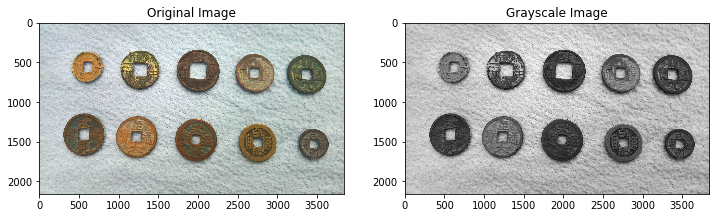

In [ ]:
plt.figure(figsize=(12,12))
plt.subplot(121)
plt.imshow(image[:,:,::-1]);
plt.title("Original Image")
plt.subplot(122)
plt.imshow(imageGray);
plt.title("Grayscale Image");

## <font style = "color:rgb(50,120,229)">Step 2.2: Split Image into R,G,B Channels</font>

In [ ]:
# Split cell into channels
# Variables are: imageB, imageG, imageR
###
### YOUR CODE HERE
###


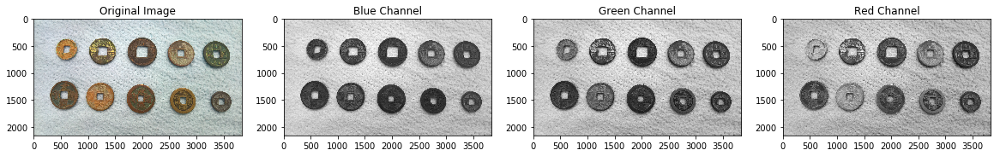

In [ ]:
plt.figure(figsize=(20,12))
plt.subplot(141)
plt.imshow(image[:,:,::-1]);
plt.title("Original Image")
plt.subplot(142)
plt.imshow(imageB);
plt.title("Blue Channel")
plt.subplot(143)
plt.imshow(imageG);
plt.title("Green Channel")
plt.subplot(144)
plt.imshow(imageR);
plt.title("Red Channel");

## <font style = "color:rgb(50,120,229)">Step 3.1: Perform Thresholding</font>

You will have to carry out this step with different threshold values to see which one suits you the most. Do not remove those intermediate images and make sure to document your findings.

In [ ]:
###
### YOUR CODE HERE
###


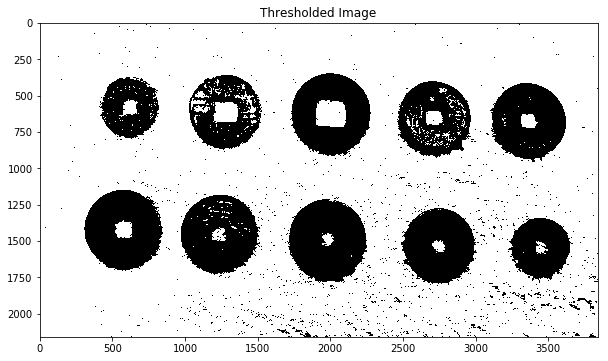

In [ ]:
# Display image using matplotlib
###
### YOUR CODE HERE
###


## <font style = "color:rgb(50,120,229)">Step 3.2: Perform morphological operations</font>

You will have to carry out this step with different kernel size, kernel shape and morphological operations to see which one (or more) suits you the most. Do not remove those intermediate images and make sure to document your findings.

In [ ]:
###
### YOUR CODE HERE
###


In [ ]:
###
### YOUR CODE HERE
###


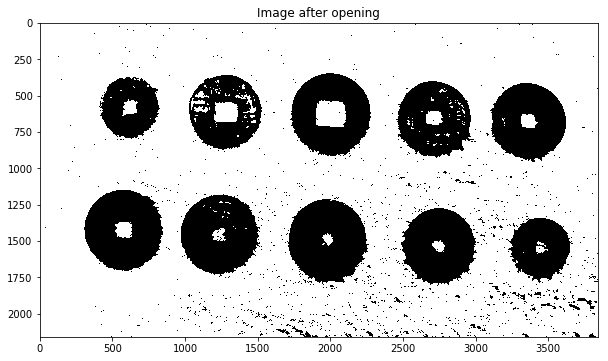

In [ ]:
###
### YOUR CODE HERE
###


In [ ]:
###
### YOUR CODE HERE
###


In [ ]:
###
### YOUR CODE HERE
###


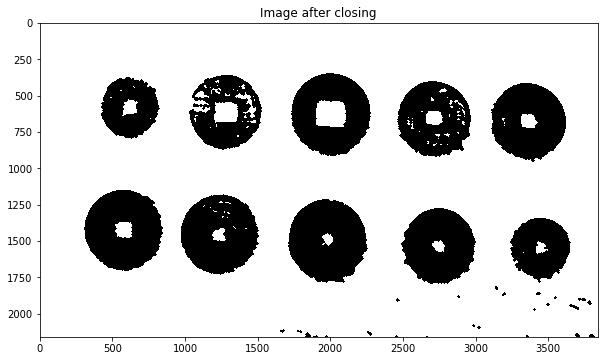

In [ ]:
###
### YOUR CODE HERE
###


In [ ]:
###
### YOUR CODE HERE
###


In [ ]:
###
### YOUR CODE HERE
###


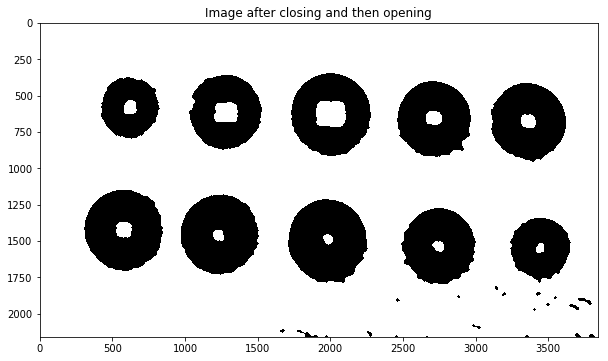

In [ ]:
###
### YOUR CODE HERE
###


In [ ]:
###
### YOUR CODE HERE
###


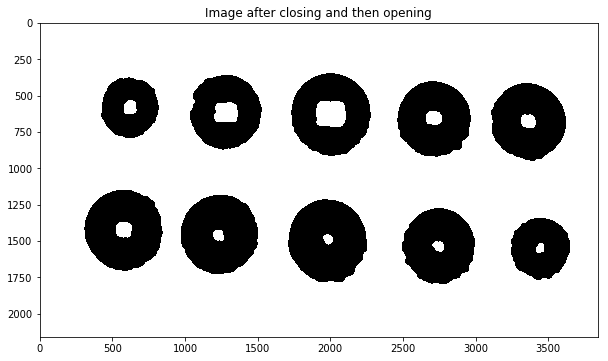

In [ ]:
###
### YOUR CODE HERE
###


In [ ]:
###
### YOUR CODE HERE
###


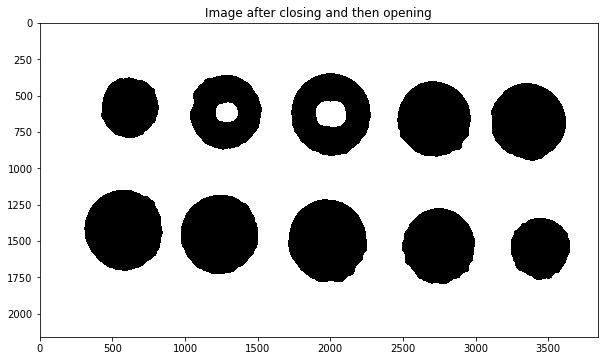

In [ ]:
###
### YOUR CODE HERE
###


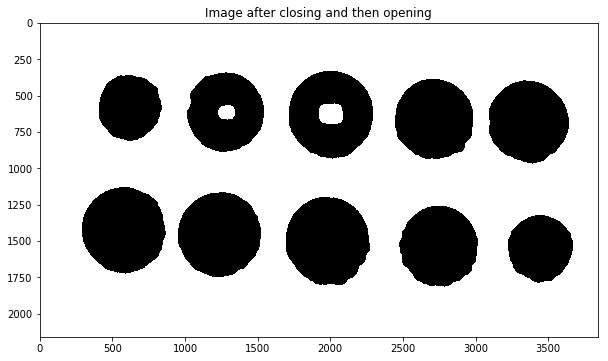

In [ ]:
###
### YOUR CODE HERE
###


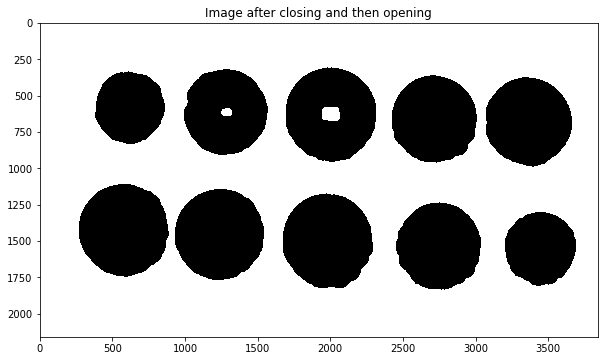

In [ ]:
###
### YOUR CODE HERE
###


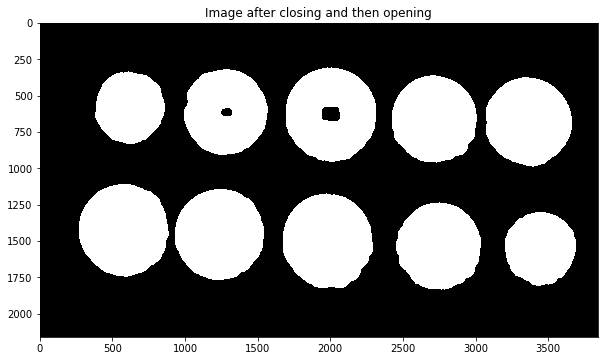

In [ ]:
###
### YOUR CODE HERE
###


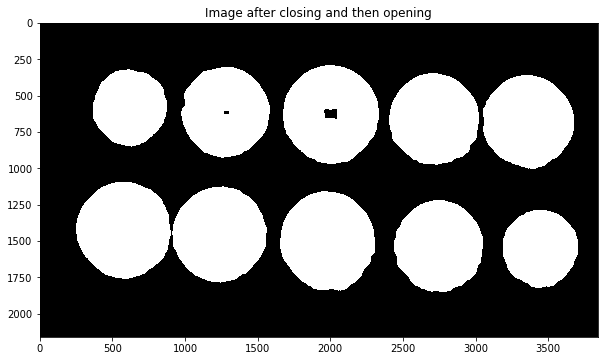

In [ ]:
###
### YOUR CODE HERE
###


## <font style = "color:rgb(50,120,229)">Step 4.1: Create SimpleBlobDetector</font>

In [ ]:
# Set up the SimpleBlobdetector with default parameters.
params = cv2.SimpleBlobDetector_Params()

params.blobColor = 0

params.minDistBetweenBlobs = 2

# Filter by Area.
params.filterByArea = False

# Filter by Circularity
params.filterByCircularity = True
params.minCircularity = 0.8

# Filter by Convexity
params.filterByConvexity = True
params.minConvexity = 0.8

# Filter by Inertia
params.filterByInertia =True
params.minInertiaRatio = 0.8

In [ ]:
# Create SimpleBlobDetector
detector = cv2.SimpleBlobDetector_create(params)


## <font style = "color:rgb(50,120,229)">Step 4.2: Detect Coins</font>

### <font style = "color:rgb(8,133,37)">Hints</font>
Use **`detector.detect(image)`** to detect the blobs (coins). The output of the function is a list of **keypoints** where each keypoint is unique for each blob.

Print the number of coins detected as well.

In [ ]:
# Detect blobs
###
### YOUR CODE HERE
###


Number of coins detected = 8


## <font style = "color:rgb(50,120,229)">Step 4.3: Display the detected coins on original image</font>

Make sure to mark the center of the blobs as well. **Use only the functions discussed in Image Annotation section in Week 1**

### <font style = "color:rgb(8,133,37)">Hints</font>
You can extract the coordinates of the center and the diameter of a blob using **`k.pt`** and **`k.size`** where `k` is a keypoint.

In [ ]:
###
### YOUR CODE HERE
###


In [ ]:
###
### YOUR CODE HERE
###


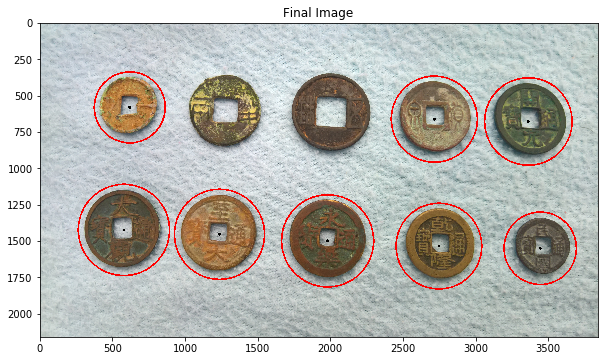

In [ ]:
###
### YOUR CODE HERE
###


**Note that we were able to detect 8 coins. So, that's your benchmark.**

## <font style = "color:rgb(50,120,229)">Step 4.4: Perform Connected Component Analysis</font>

Now, let's perform Connected Component Analysis (CCA) on the binary image to find out the number of connected components. Do you think we can use CCA to calculate number of coins? Why/why not?

In [ ]:
###
### YOUR CODE HERE
###


In [ ]:
###
### YOUR CODE HERE
###


Number of connected components detected = 11


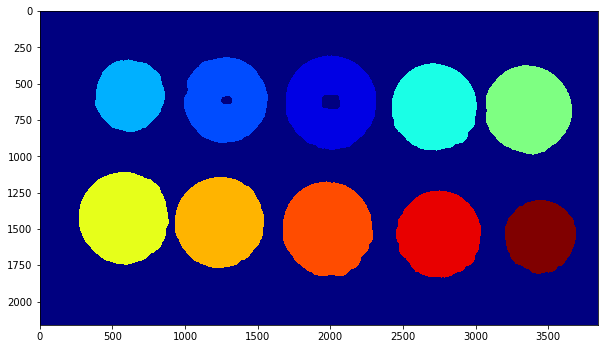

In [ ]:
###
### YOUR CODE HERE
###


## <font style = "color:rgb(50,120,229)">Step 4.5: Detect coins using Contour Detection</font>

In the final step, perform Contour Detection on the binary image to find out the number of coins.

In [ ]:
# Find all contours in the image
###
### YOUR CODE HERE
###


In [ ]:
# Print the number of contours found
###
### YOUR CODE HERE
###


Number of contours found = 13


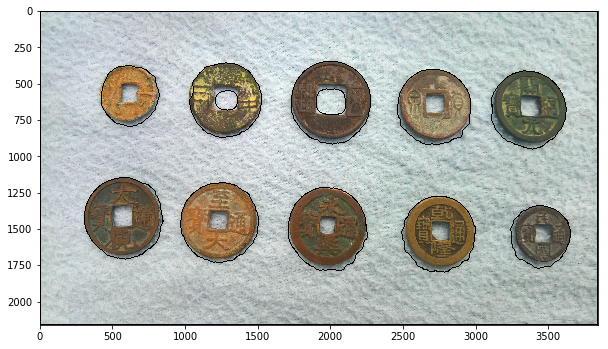

In [ ]:
# Draw all contours
###
### YOUR CODE HERE
###


Number of contours found = 1


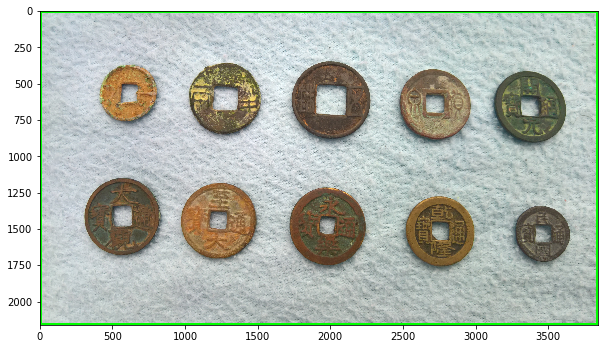

In [ ]:
# Remove the inner contours
# Display the result
###
### YOUR CODE HERE
###


What do you think went wrong? As we can see, the outer box was detected as a contour and with respect to it, all other contours are internal and that's why they were not detected. How do we remove that? Let's see if we can use area of contours here.

In [ ]:
# Print area and perimeter of all contours
###
### YOUR CODE HERE
###


Contour #1 has area = 135398.0 and perimeter = 1401.449918627739
Contour #2 has area = 203535.5 and perimeter = 1720.5697610378265
Contour #3 has area = 242100.5 and perimeter = 1871.0794281959534
Contour #4 has area = 229459.0 and perimeter = 1813.3809397220612
Contour #5 has area = 235121.5 and perimeter = 1837.1382957696915
Contour #6 has area = 16605.5 and perimeter = 485.2031031847
Contour #7 has area = 30872.0 and perimeter = 666.9015874862671
Contour #8 has area = 213446.5 and perimeter = 1743.339308977127
Contour #9 has area = 207230.0 and perimeter = 1723.2144236564636
Contour #10 has area = 130007.0 and perimeter = 1371.1067732572556
Contour #11 has area = 197785.0 and perimeter = 1696.1261086463928
Contour #12 has area = 243313.0 and perimeter = 1854.836783528328
Contour #13 has area = 8288401.0 and perimeter = 11996.0


In [ ]:
# Print maximum area of contour
# This will be the box that we want to remove
###
### YOUR CODE HERE
###


Maximum area of contour = 8288401.0


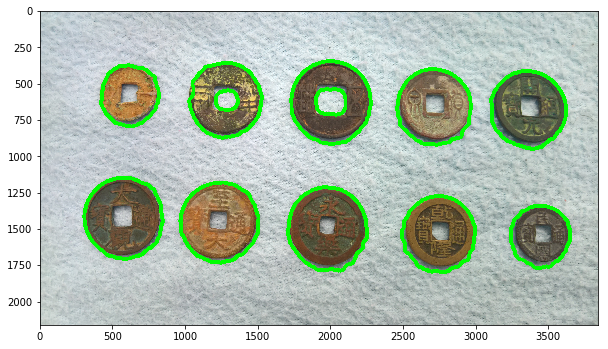

In [ ]:
# Remove this contour and plot others
###
### YOUR CODE HERE
###


Now, we have to remove the internal contours. Again here we can use area or perimeter.

In [ ]:
# Print sorted area of contours
###
### YOUR CODE HERE
###


16605.5
30872.0
130007.0
135398.0
197785.0
203535.5
207230.0
213446.5
229459.0
235121.5
242100.5
243313.0
8288401.0


We can clearly see the jump from 2nd area to 3rd. These are the 2 inner contours.

Number of contours = 10


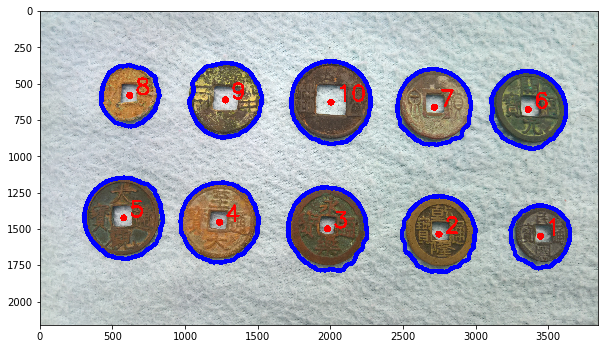

In [ ]:
# Remove the 2 inner contours
# Plot the rest of them
###
### YOUR CODE HERE
###


Number of coins detected = 10


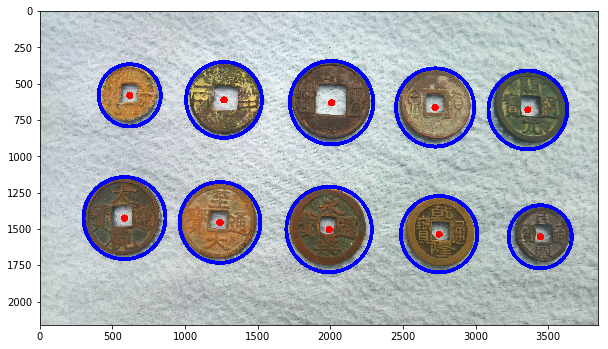

In [ ]:
# Fit circles on coins
###
### YOUR CODE HERE
###
